In [1]:
!pip install PyPortfolioOpt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 3.3 MB/s eta 0:00:00


###Necessary Imports

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pypfopt import EfficientFrontier, risk_models, expected_returns

###Load The Dataset

In [3]:
data=pd.read_csv('/content/Main_Dataset.csv')
data.sample(5)

,Year-Month,ME1 BM1,ME1 BM2,ME1 BM3,ME1 BM4,ME1 BM5,ME1 BM6,ME1 BM7,ME1 BM8,ME1 BM9,...,BIG LoBM,ME10 BM2,ME10 BM3,ME10 BM4,ME10 BM5,ME10 BM6,ME10 BM7,ME10 BM8,ME10 BM9,ME10 BM10
239,201912,7.1789,1.0083,11.6752,4.0841,5.7509,3.9719,3.0517,6.8259,3.2107,...,3.3544,3.2326,1.0039,3.2962,2.7665,-0.2666,1.1267,5.0297,3.5176,1.5200
282,202307,2.1947,-1.7274,-1.1539,-1.4990,3.9454,-0.7150,2.2377,10.4915,7.0026,...,2.0469,3.9094,3.9429,6.3474,5.0429,4.2477,8.9558,-7.2257,5.7873,3.3402
229,201902,8.2425,6.1773,0.1077,3.8009,6.4958,6.0824,4.9063,5.5329,5.6363,...,5.0523,3.3213,1.9059,3.5914,2.5987,2.7926,0.5955,0.2920,3.0365,1.6370
104,200809,-15.5557,-16.1336,-14.2161,-14.1422,-13.9840,-14.3858,-7.8200,-11.5661,-10.4573,...,-13.4980,-10.2846,-10.4969,-11.7840,-7.7106,-11.8369,-20.2511,-1.5940,-17.2296,-99.9900
258,202107,-10.5362,-9.4433,-8.8715,-8.8119,-9.1348,-2.3217,-7.8935,-4.5035,-0.6738,...,3.9538,2.9985,1.7695,-0.0116,1.2667,-0.9832,-1.9134,-1.4078,-2.7319,-1.9534


###Methods

- Method to select the data yearwise from the dataset

In [4]:
def get_required_rows(data,iter):
  startindex,endindex=12*(iter-1),12*(iter-1)+12
  newdata=data.iloc[startindex:endindex,:]
  return newdata

- Method used to compute the cummulative return rate for yearly data

In [5]:
def get_cummulative_return(data):
  cummulative_return_rate={} #List to store the returns after 1 year on everay stock in every sector
  new_data=data.drop('Year-Month',axis=1)
  for col in new_data.columns:   #Compute for every stock in each sector
    res=0
    returns=1
    for vals in data[col]:       #Access the 12 row values under each column
      returns*=(1+(vals/100))      #Product (1+rate/100) over 12 years
    returns-=1
    returns*=100                 #[Product (1+rate/100) -1]*100
    cummulative_return_rate[col]=returns   #Append the cummulative returns to List
  return cummulative_return_rate

#year_data=get_required_rows(data,1)
#yearly_return=get_cummulative_return(year_data)
#print(yearly_return)

- Method used to compute the total return after 1 year on investment

In [6]:
def compute_year_return(c_return_rates,investment):
  return sum([c_return_rates[stock]*investment[stock] for stock in investment.keys()])

### The Update Rule
 - The update rule tries to increase the weight/investment on those stocks whose expected return (investment[i]*reward) is greater than the total annual return and vice-versa.
 - It will further use the relative return rate as an amplification factor
 - The exploration factor prevents the investment vector from getting stuck at a local minima

In [7]:
def update_investment_vector(c_return_rates,investment,reward,alpha=0.01,exploration_factor=0.1):
  #Calculate the relative return rate
  total_return=sum(c_return_rates.values())
  rel_return=dict([(k,v/total_return) for k,v in c_return_rates.items()])

  #Update the investment vector
  for k in investment.keys():
    exploration=np.random.uniform(-exploration_factor,exploration_factor) #We add a certain amount of exploration
    investment[k]+=alpha*(investment[k]*reward-reward)*rel_return[k] + exploration
    if investment[k] < 0 : # Restricts investments from becoming negative
      investment[k] = 0

  #Normalize the weights
  total_inv=sum(list(investment.values()))
  new_inv={k:v/total_inv for k,v in investment.items()}

  return new_inv

- Function to calculate Sharpe ratio return

In [8]:
def Get_Yearly_Sharp_Ratio_Return(year_data,investment):
  data_m=year_data.drop('Year-Month',axis=1)
  data_m=data_m*(1/100)
  mean=np.mean(data_m,axis=0)
  cov=np.cov(data_m,rowvar=False)
  ef=EfficientFrontier(mean,cov)
  weights=ef.max_sharpe(risk_free_rate=-5)
  w=np.array(list(weights.values()))
  inv=list(investment.values())
  return np.dot(w,inv)*100*12


- Training Function

In [9]:
def train(investment,data,train_years=21):
  S_Return=[] #List used to store the sharp ratio return
  C_Return=[] #List used to store our yearly returns
  Reward=[] #List Used to store the reward over the period of time
  Investment_History=[] #List used to store the changes over the investment vector
  #Fetch the yearly data for 21 years and run the loop
  for i in range(1,train_years+1):
    year_data=get_required_rows(data,i) #Fetch the data for ith year
    c_return=get_cummulative_return(year_data) #Get the cummulative return for that years data
    yearend_return=compute_year_return(c_return,investment) #Fetch the year_end_return
    sharp_ratio_return=Get_Yearly_Sharp_Ratio_Return(year_data,investment) #Fetch the sharp ratio return
    reward=-abs(sharp_ratio_return-yearend_return)   #Fetch the reward
    investment=update_investment_vector(c_return,investment,reward)  #Update the investment vector
    S_Return.append(sharp_ratio_return)
    C_Return.append(yearend_return)
    Reward.append(reward)
    Investment_History.append(investment)
  return S_Return,C_Return,Reward,Investment_History,investment

- Function used to perform test using new investment vector

In [10]:
def test(investment):
  dataset_y1=get_required_rows(data,22) #The data from the 22nd year
  dataset_y2=get_required_rows(data,23) #The data from the 23rd year
  dataset_y3=get_required_rows(data,24) #The data from the 24th year
  test_data=pd.concat([dataset_y1,dataset_y2,dataset_y3]) #Create the test dataset by concatnating the data from all 3 years
  c_return=get_cummulative_return(test_data) #Get the cummulative return for that test data
  RL_return=compute_year_return(c_return,investment) #Get the return from RL Agent on the test data
  Sharp_Ratio_return=Get_Yearly_Sharp_Ratio_Return(test_data,investment) #Fetch the sharp ratio return this time on 3 years data using the same method
  return Sharp_Ratio_return-RL_return

- Function Used To Draw The Visual Plots

In [11]:
def plot_performance(S_Return, C_Return, Reward, investment_history,e):
  #print(f"Epoch:{e+1}")
  fig,axes=plt.subplots(nrows=2,ncols=2,figsize=(20,6))

  Year = range(len(S_Return))

  #Plot The Sharp Ration Return Against The Computed Return
  axes[0][0].plot(Year,S_Return,label="Sharp_Ratio Returns")
  axes[0][0].plot(Year,C_Return,label="Computed_Returns")
  axes[0][0].set_xlabel("Year")
  axes[0][0].set_ylabel("Returns")
  axes[0][0].set_title("Sharpe Ratio Returns vs Computed Returns")
  axes[0][0].grid(True)
  axes[0][0].legend()

  #Reward Over Time
  axes[0][1].plot(Year,Reward,color='green',label='Reward')
  axes[0][1].set_xlabel("Year")
  axes[0][1].set_ylabel("Reward")
  axes[0][1].set_title("Reward Over Time")
  axes[0][1].grid(True)
  axes[0][1].legend()



  #Cummulative Return Over Time
  cuml_reward=np.cumsum(Reward)
  axes[1][0].plot(Year,cuml_reward,color='purple')
  axes[1][0].set_xlabel("Year")
  axes[1][0].set_ylabel("Cummulative Reward")
  #axes[1][0].set_title("Cumulative Computed Return Over Time")
  axes[1][0].grid(True)
  #axes[1][0].legend()

  i=1
  for d in investment_history:
    labels=list(d.keys())[:10]
    vals=list(d.values())[:10]
    axes[1][1].plot(labels,vals, marker='o',label=f"Year {i}")
    i+=1 #Month update
  plt.xlabel("Stocks")
  plt.ylabel("Investment Weight")
  plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
  plt.grid()
  plt.show()



# plt.tight_layout()
# plt.legend()
# plt.show()


- Function used to train 1 epoch over the entire batch and to perform test along with drawing the visual plots

In [12]:
def Batch_Train(epoch,investment):
  Difference=[] #List used to store the difference between computed return and sharp ratio return over the epoches
  for e in range(epoch):
    S_Return,C_Return,Reward,Investment_History,investment=train(investment,data)
    if e%20 == 0:
      plot_performance(S_Return, C_Return, Reward, Investment_History,e)
    diff=test(investment)
    Difference.append(diff)
  return Difference


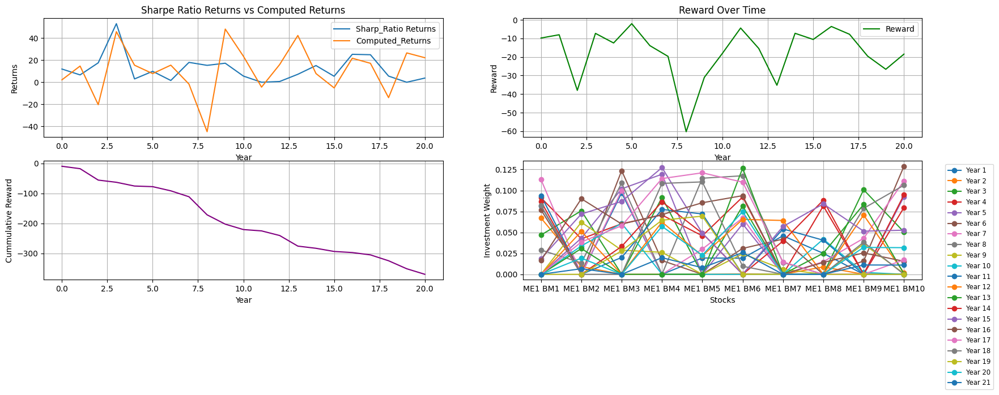

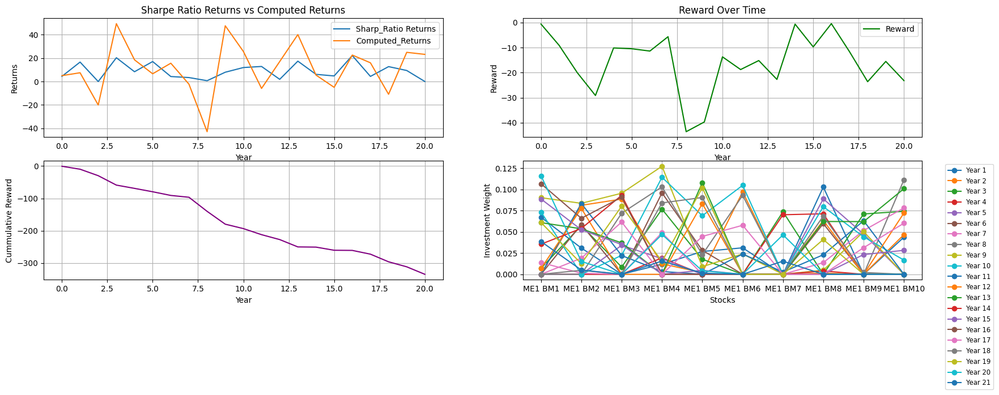

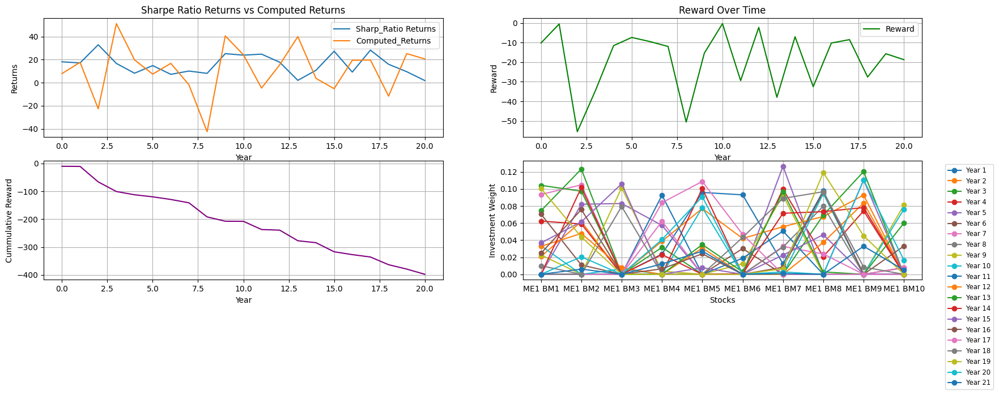

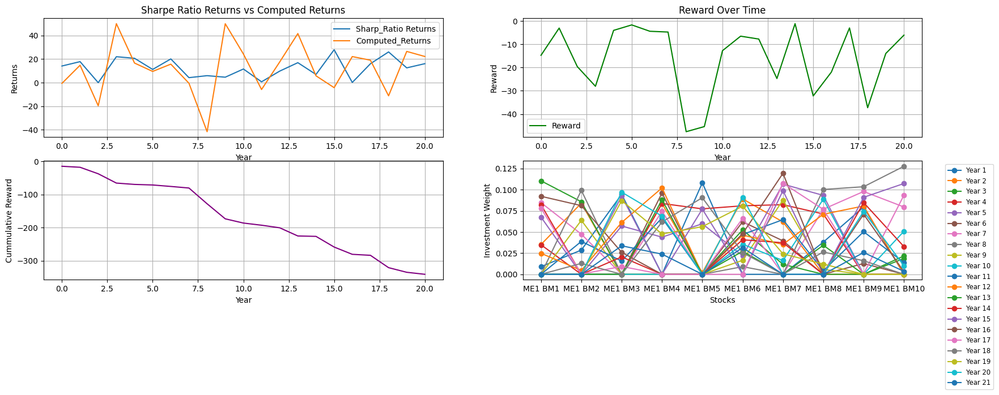

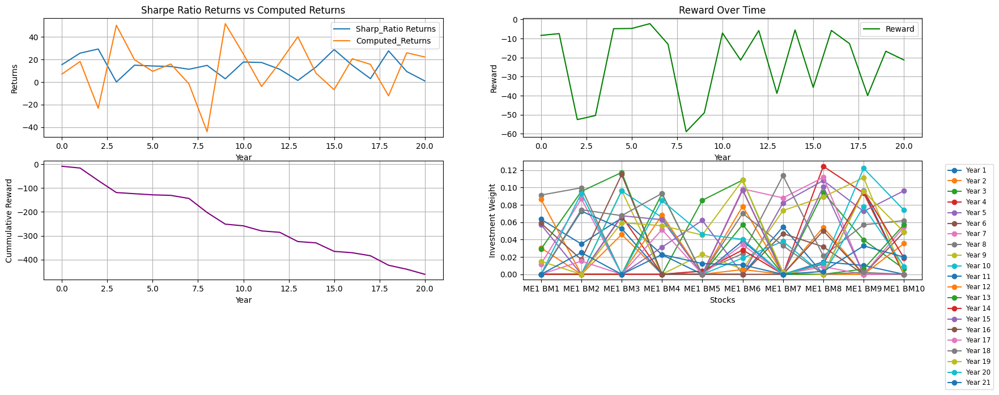

...

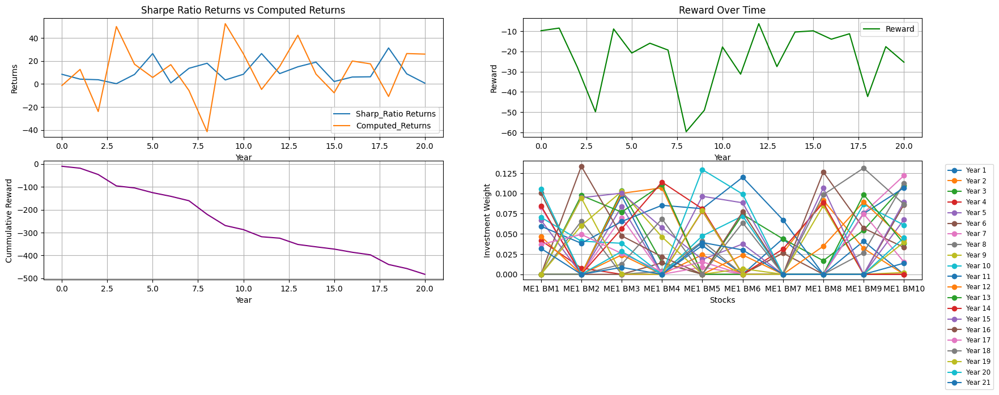

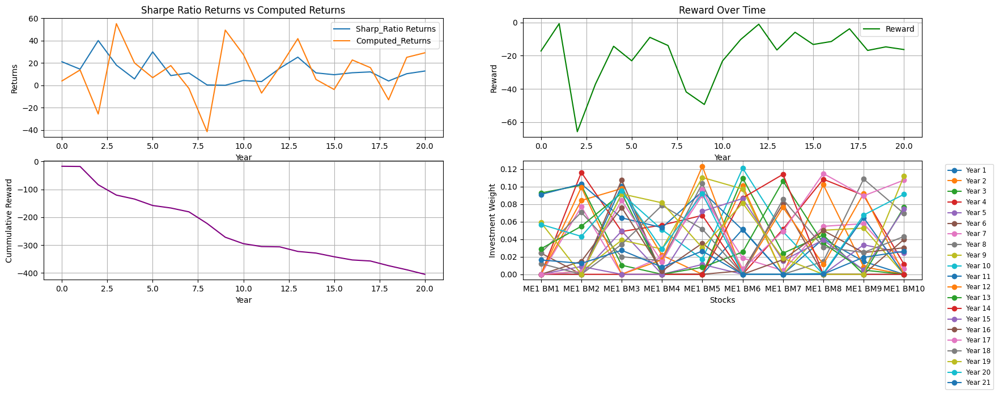

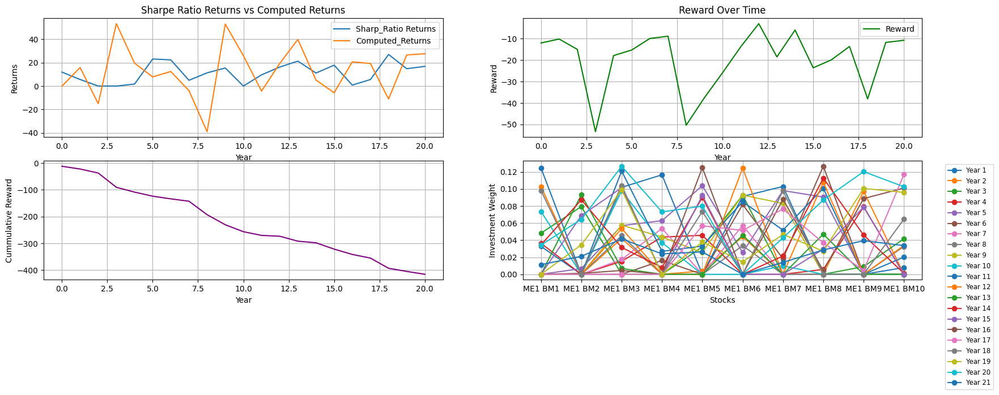

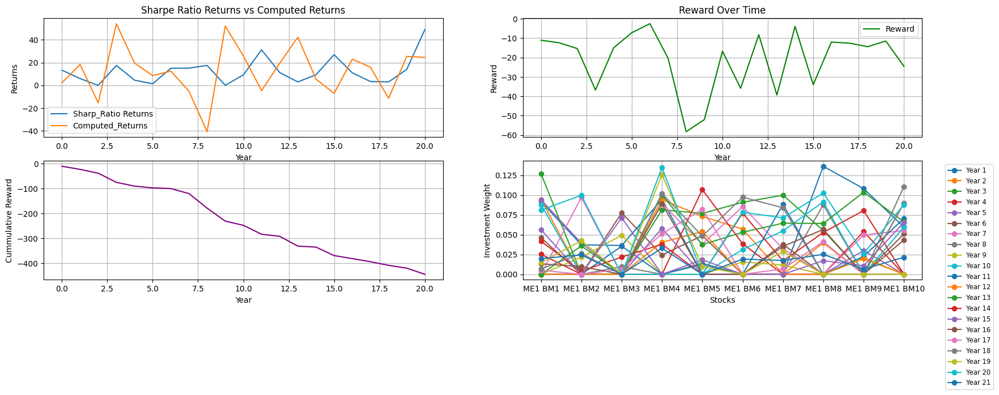

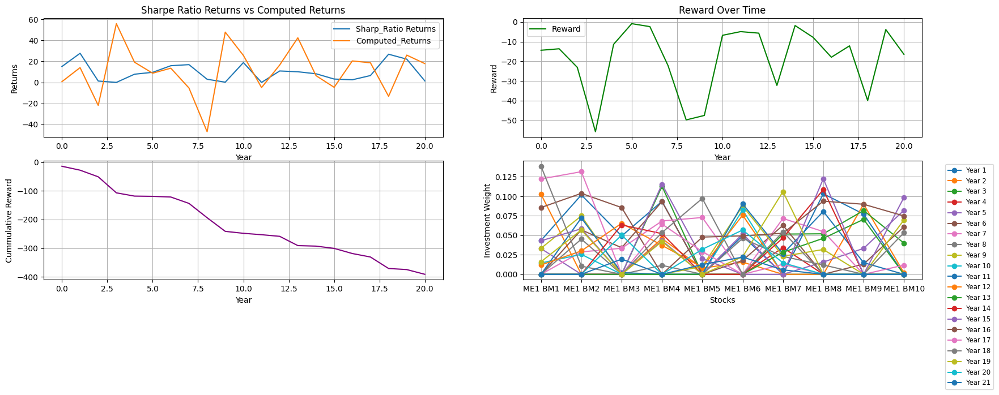

In [22]:
investment = dict([(col,1/100) for col in data.drop('Year-Month', axis=1).columns])
Difference=Batch_Train(1000,investment)

###Test Results

- Plot The Difference Between Sharp Ratio Return And RL Agent Return Over Multiple Epoches

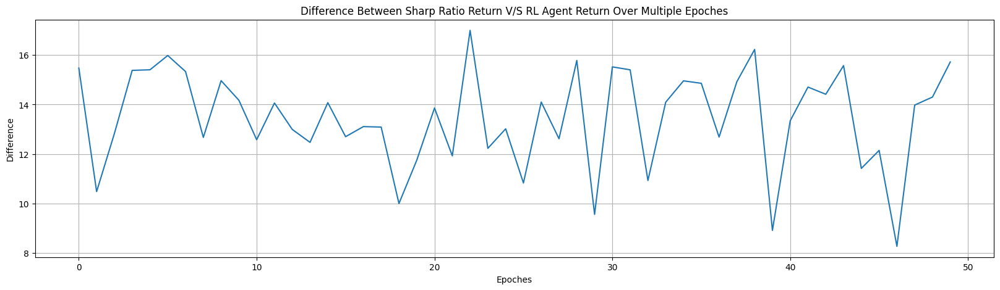

In [26]:
plt.figure(figsize=(20,5))
Absolute_Diff=list(map(abs,Difference))
Difference_avg = [sum(Absolute_Diff[i:i+20]) / 20 for i in range(0, len(Difference), 20)]
plt.plot(Difference_avg)
plt.title("Difference Between Sharp Ratio Return V/S RL Agent Return Over Multiple Epoches")
plt.grid()
plt.xlabel("Epoches")
plt.ylabel("Difference")
plt.show()

In [ ]:
#investment = dict([(col,np.random.randint(1,100)) for col in data.drop('Year-Month', axis=1).columns])
#total=sum(list(investment.values()))
#investment={col:v/total for col,v in investment.items()}
#Batch_Train(40,investment)